In [1]:
import os
import netCDF4
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
from heatmap import corrplot # SOURCE: https://github.com/dylan-profiler/heatmaps/blob/master/heatmap/heatmap.py

In [2]:
PARAM_DATE = '2019-01-01'
PARAM_MODIS_RES = 'L2'
# PARAM_MODIS_SATELLITE = 'MOD04'  # 'MOD04' for Terra, 'MYD04' for Aqua

DATA_PATH = '../..'
# H8_PARENT_DIR = 'H8_MODIS_2019-2020'
# H8_MODIS_DIR = f'H8_{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}'
# H8_MODIS_FILENAME = f'H8_{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE}.nc'
# MODIS_PARENT_DIR = 'MODIS_L2_Aus_2019-2020'
# MODIS_FILENAME = f'{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE}.nc'

# H8_MODIS_PATH = os.path.join(DATA_PATH, H8_PARENT_DIR, H8_MODIS_DIR, H8_MODIS_FILENAME)
# MODIS_PATH = os.path.join(DATA_PATH, MODIS_PARENT_DIR, MODIS_FILENAME)

In [3]:
def read_H8_MODIS(date, modis_res, modis_sat, data_path):
    
    H8_PARENT_DIR = 'H8_MODIS_2019-2020'
    H8_MODIS_DIR = f'H8_{modis_sat}_{modis_res}'
    H8_MODIS_FILENAME = f'H8_{modis_sat}_{modis_res}_Aus_0.05_{date}.nc'
    H8_MODIS_PATH = os.path.join(data_path, H8_PARENT_DIR, H8_MODIS_DIR, H8_MODIS_FILENAME)
    
    df = xr.open_dataset(H8_MODIS_PATH).to_dataframe()
    df = df.drop(columns=['time','solar_azimuth_angle','solar_zenith_angle'])
    
    return df

def read_MODIS(date, modis_res, modis_sat, data_path):
    
    MODIS_PARENT_DIR = 'MODIS_L2_Aus_2019-2020'
    MODIS_FILENAME = f'{modis_sat}_{modis_res}_Aus_0.05_{date}.nc'
    MODIS_PATH = os.path.join(data_path, MODIS_PARENT_DIR, MODIS_FILENAME)
    
    df = xr.open_dataset(MODIS_PATH).drop_dims(['corner','file']).to_dataframe()
    
    return df

In [4]:
df_H8_MOD04 = read_H8_MODIS(PARAM_DATE, PARAM_MODIS_RES, 'MOD04', DATA_PATH)
df_H8_MYD04 = read_H8_MODIS(PARAM_DATE, PARAM_MODIS_RES, 'MYD04', DATA_PATH)
df_MOD04 = read_MODIS(PARAM_DATE, PARAM_MODIS_RES, 'MOD04', DATA_PATH)
df_MYD04 = read_MODIS(PARAM_DATE, PARAM_MODIS_RES, 'MYD04', DATA_PATH)

df_H8 = pd.concat([df_H8_MOD04, df_H8_MYD04], axis=0)
df_MODIS = pd.concat([df_MOD04, df_MYD04], axis=0)

df_H8_MODIS = pd.concat([df_H8, df_MODIS['AOD_550_Dark_Target_Deep_Blue_Combined']], axis=1).reset_index().drop(columns='sounding')
channel_list = [col for col in df_H8_MODIS.columns if col.startswith('channel')]

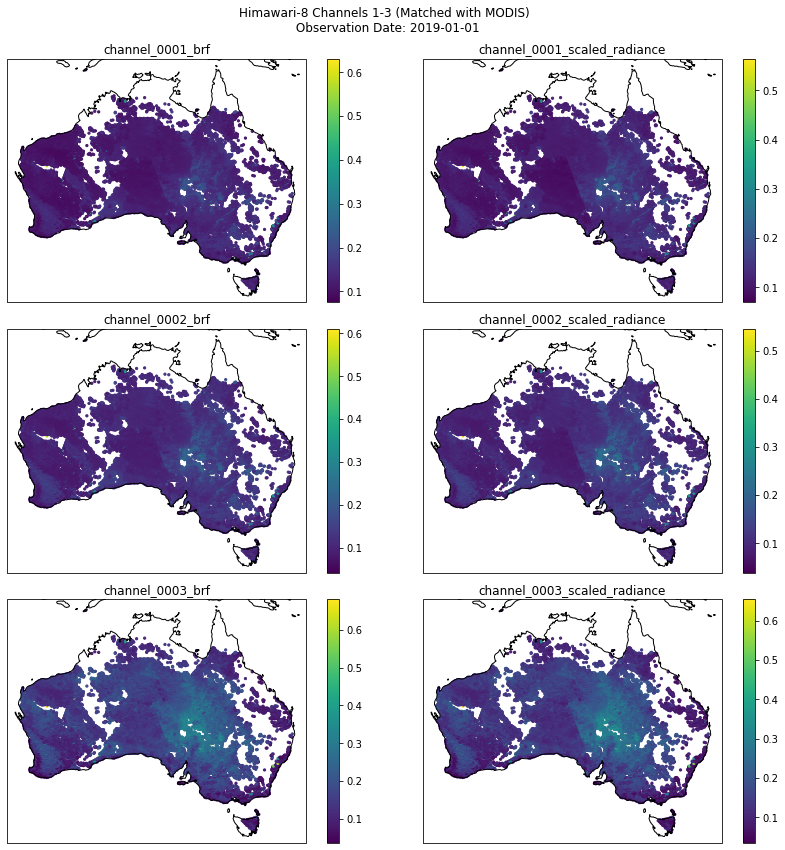

In [210]:
fig = plt.figure(figsize=(12,12))

for i, channel in enumerate(channel_list[:6]):
    ax = plt.subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    sc = ax.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS[channel], s=5)
    ax.coastlines()
    fig.colorbar(sc, ax=ax)
    ax.set_title(channel)

fig.suptitle(f'Himawari-8 Channels 1-3 (Matched with MODIS) \n Observation Date: {PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.92)
plt.savefig(f'../../sem1report_himawari_vis.png', facecolor='white', bbox_inches='tight')

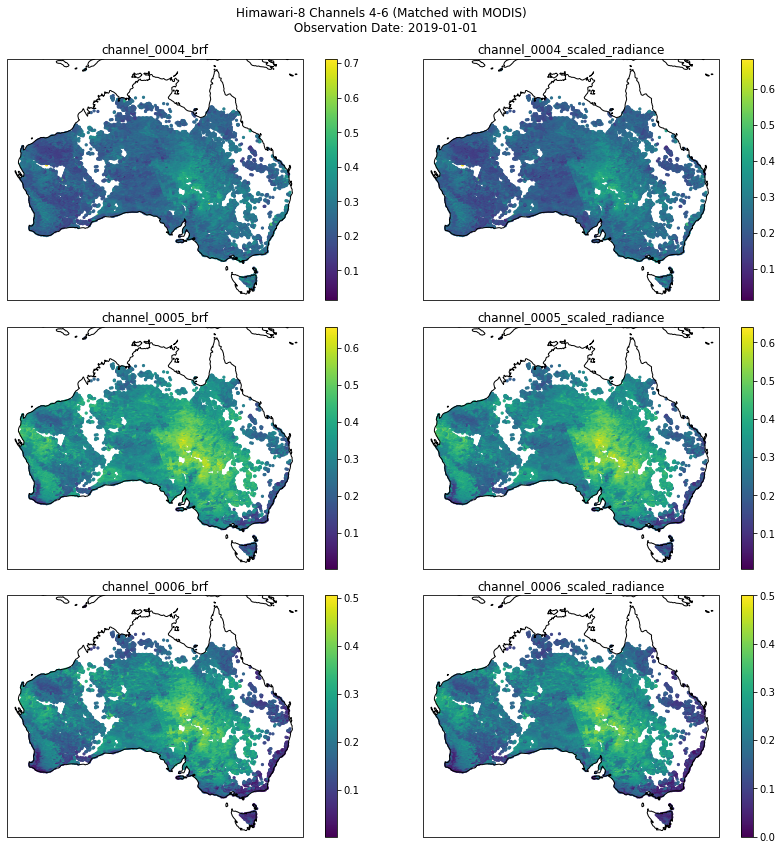

In [209]:
fig = plt.figure(figsize=(12,12))

for i, channel in enumerate(channel_list[6:12]):
    ax = plt.subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    sc = ax.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS[channel], s=5)
    ax.coastlines()
    fig.colorbar(sc, ax=ax)
    ax.set_title(channel)

fig.suptitle(f'Himawari-8 Channels 4-6 (Matched with MODIS) \n Observation Date: {PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.92)
plt.savefig(f'../../sem1report_himawari_nir.png', facecolor='white', bbox_inches='tight')

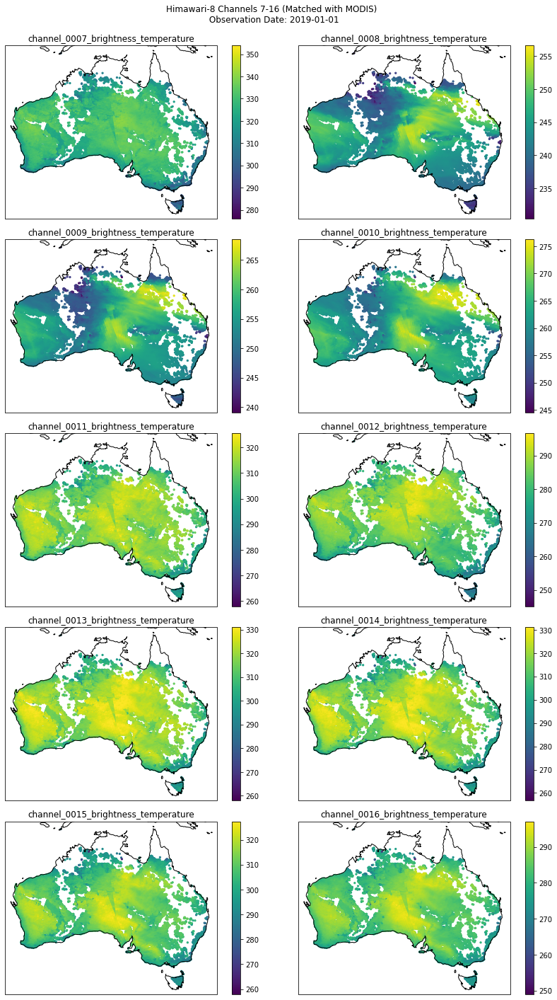

In [202]:
fig = plt.figure(figsize=(12,20))

for i, channel in enumerate(channel_list[12:]):
    ax = plt.subplot(5, 2, i+1, projection=ccrs.PlateCarree())
    sc = ax.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS[channel], s=5)
    ax.coastlines()
    fig.colorbar(sc, ax=ax)
    ax.set_title(channel)

fig.suptitle(f'Himawari-8 Channels 7-16 (Matched with MODIS) \n Observation Date: {PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.94)
plt.savefig(f'../../sem1report_himawari_ir.png', facecolor='white', bbox_inches='tight')

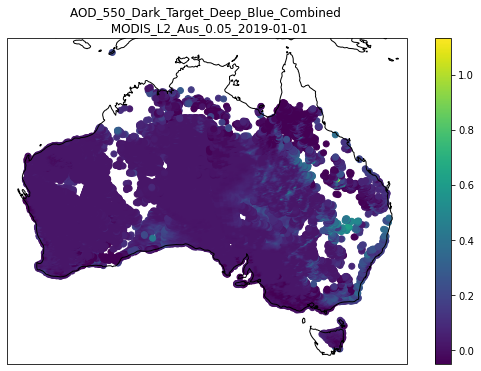

In [17]:
plt.figure(figsize=(10,6))
ax = plt.axes(projection=ccrs.PlateCarree())
plt.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS['AOD_550_Dark_Target_Deep_Blue_Combined'])
plt.colorbar()
ax.coastlines()
ax.set_title(f'AOD_550_Dark_Target_Deep_Blue_Combined \n MODIS_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE}')
# plt.savefig(f'heatmap_AOD_MODIS_{PARAM_MODIS_RES}_{PARAM_DATE}.png', facecolor='white', bbox_inches='tight')
plt.show()

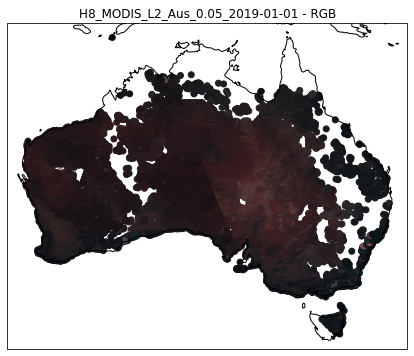

In [7]:
rgb = np.stack([df_H8_MODIS['channel_0003_scaled_radiance'], df_H8_MODIS['channel_0002_scaled_radiance'], df_H8_MODIS['channel_0001_scaled_radiance']], axis=1)
# rgb = np.stack([df_H8_MODIS['channel_0003_brf'], df_H8_MODIS['channel_0002_brf'], df_H8_MODIS['channel_0001_brf']], axis=1)

plt.figure(figsize=(10,6))
ax = plt.axes(projection=ccrs.PlateCarree())
plt.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=rgb)
ax.coastlines()
ax.set_title(f'H8_MODIS_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE} - RGB')
plt.show()

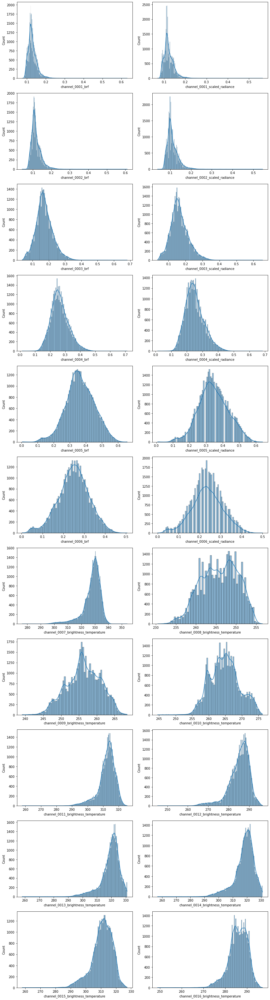

In [8]:
f, axs = plt.subplots(11, 2, figsize=(12,44))
for i, var in enumerate(channel_list):
    row = i//2
    col = i%2
    sns.histplot(data=df_H8_MODIS, x=var, kde=True, ax=axs[row, col])
f.tight_layout()

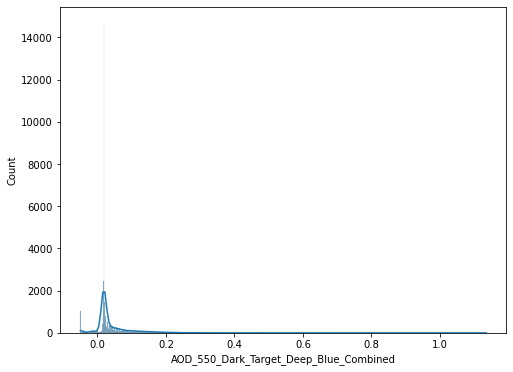

In [9]:
plt.figure(figsize=(8,6))
sns.histplot(data=df_H8_MODIS, x='AOD_550_Dark_Target_Deep_Blue_Combined', kde=True)
plt.show()

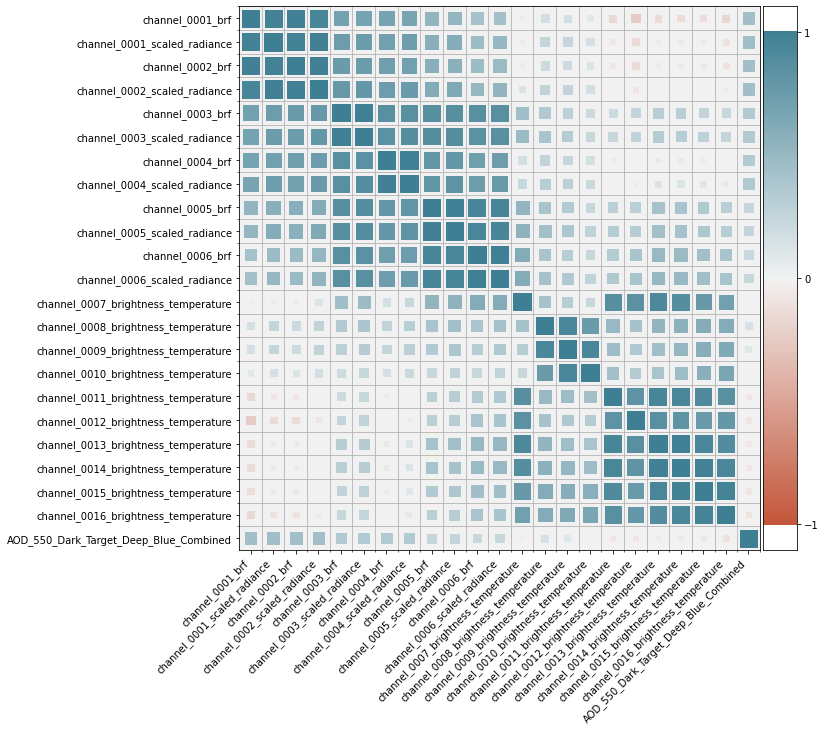

In [10]:
corr = df_H8_MODIS.drop(columns=['lat','lon']).corr()
plt.figure(figsize=(10,10))
corrplot(corr, size_scale=300)

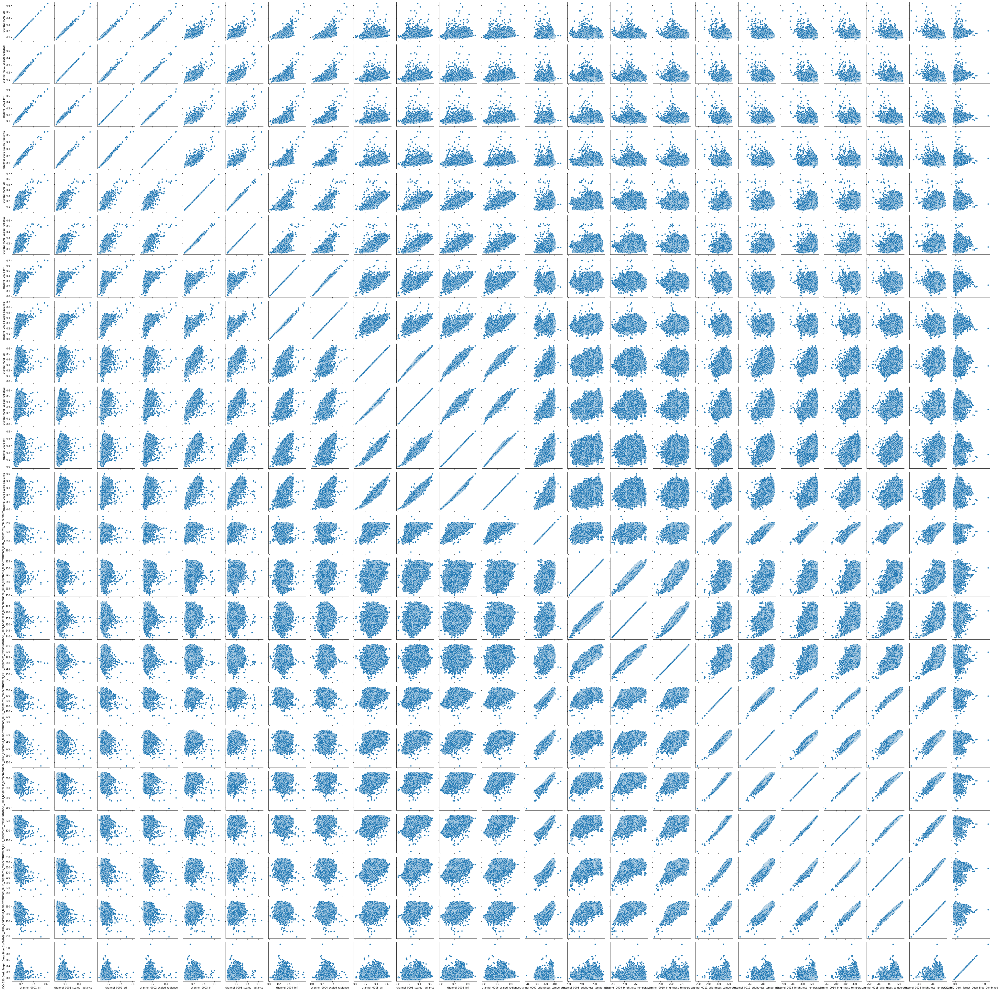

In [11]:
g = sns.PairGrid(df_H8_MODIS.drop(columns=['lat','lon']))
g.map(sns.scatterplot)
plt.show()

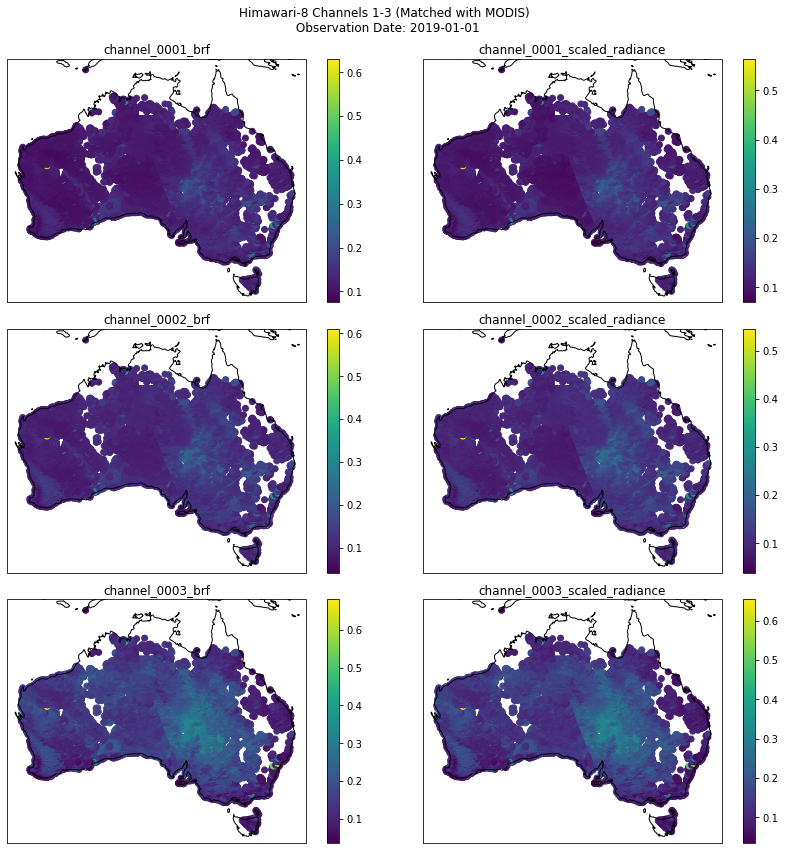

In [26]:
channel_list = [col for col in df_H8_MODIS.columns if col.startswith('channel')]

fig = plt.figure(figsize=(12,12))

for i, channel in enumerate(channel_list[:6]):
    ax = plt.subplot(3, 2, i+1, projection=ccrs.PlateCarree())
    sc = ax.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS[channel])
    ax.coastlines()
    fig.colorbar(sc, ax=ax)
    ax.set_title(channel)
    
fig.suptitle(f'Himawari-8 Channels 1-3 (Matched with MODIS) \n Observation Date: {PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.92)
plt.savefig(f'../../presentation_himawari.png', facecolor='white', bbox_inches='tight')

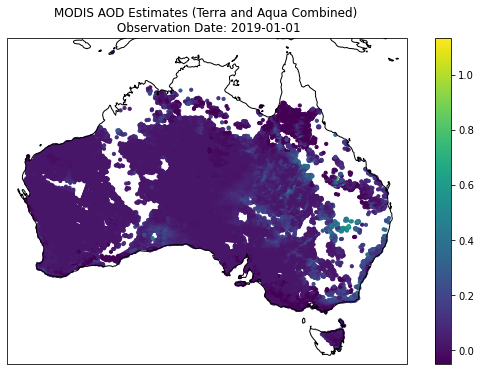

In [235]:
plt.figure(figsize=(10,6))
ax = plt.axes(projection=ccrs.PlateCarree())
plt.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS['AOD_550_Dark_Target_Deep_Blue_Combined'], s=10)
plt.colorbar()
ax.coastlines()
ax.set_title(f'MODIS AOD Estimates (Terra and Aqua Combined) \n Observation Date: {PARAM_DATE}')
# plt.savefig(f'../../sem1report_modis.png', facecolor='white', bbox_inches='tight')
plt.show()

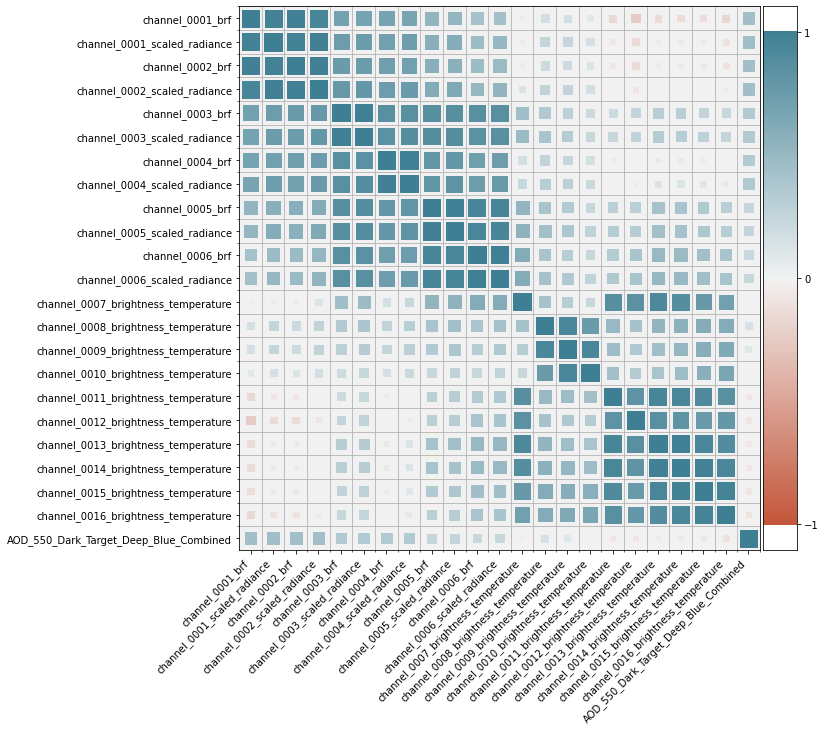

In [29]:
corr = df_H8_MODIS.drop(columns=['lat','lon']).corr()
plt.figure(figsize=(10,10))
corrplot(corr, size_scale=300)
plt.savefig(f'../../presentation_corr.png', facecolor='white', bbox_inches='tight')

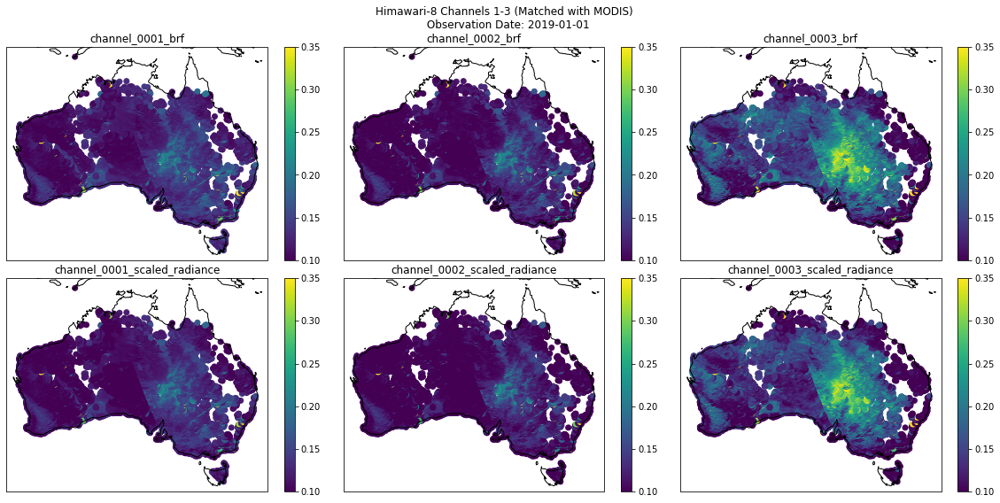

In [73]:
channel_list = [col for col in df_H8_MODIS.columns if col.startswith('channel')]

fig = plt.figure(figsize=(16,8))

indexes = [1,4,2,5,3,6]

for i,channel in zip(indexes, channel_list):
    ax = plt.subplot(2, 3, i, projection=ccrs.PlateCarree())
    sc = ax.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS[channel], vmin=0.1, vmax=0.35)
    ax.coastlines()
    fig.colorbar(sc, ax=ax)
    ax.set_title(channel)
    
fig.suptitle(f'Himawari-8 Channels 1-3 (Matched with MODIS) \n Observation Date: {PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.savefig(f'../../presentation_himawari_transpose.png', facecolor='white', bbox_inches='tight')

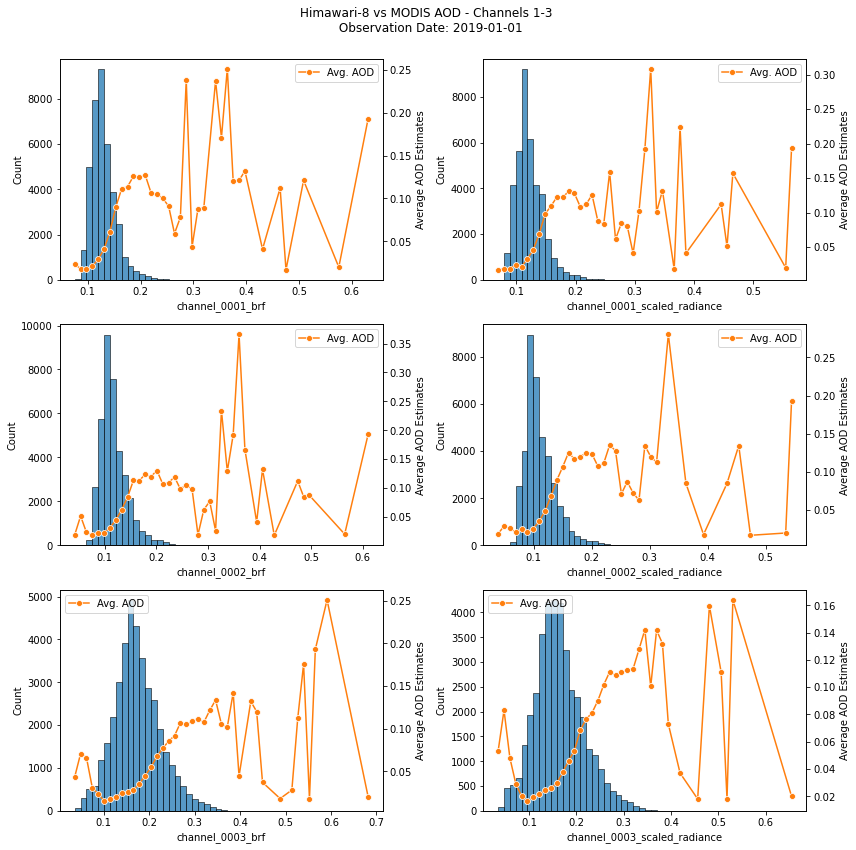

In [222]:
fig = plt.figure(figsize=(12,12))

for i, channel in enumerate(channel_list[:6]):
    ax = plt.subplot(3, 2, i+1)
    
    bins = np.histogram_bin_edges(df_H8_MODIS[channel], bins=50)
    
    df = df_H8_MODIS.loc[:,[channel,'AOD_550_Dark_Target_Deep_Blue_Combined']]
    df['bin'] = df_H8_MODIS[channel].apply(lambda x: bins[bins <= x].max())
    df = df.groupby('bin').agg({"AOD_550_Dark_Target_Deep_Blue_Combined": np.mean})#, "channel_0001_brf": np.size})
    
    ax = sns.histplot(data=df_H8_MODIS, x=channel, bins=bins)
    ax2 = ax.twinx()
    sns.lineplot(x=df.index, y='AOD_550_Dark_Target_Deep_Blue_Combined', data=df, marker='o', color='tab:orange', ax=ax2)
    ax2.set_ylabel('Average AOD Estimates')
    ax2.legend(labels=['Avg. AOD'])
    
fig.suptitle(f'Himawari-8 vs MODIS AOD - Channels 1-3 \n Observation Date: {PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.92)
plt.savefig(f'../../sem1report_h8_aod_vis.png', facecolor='white', bbox_inches='tight')

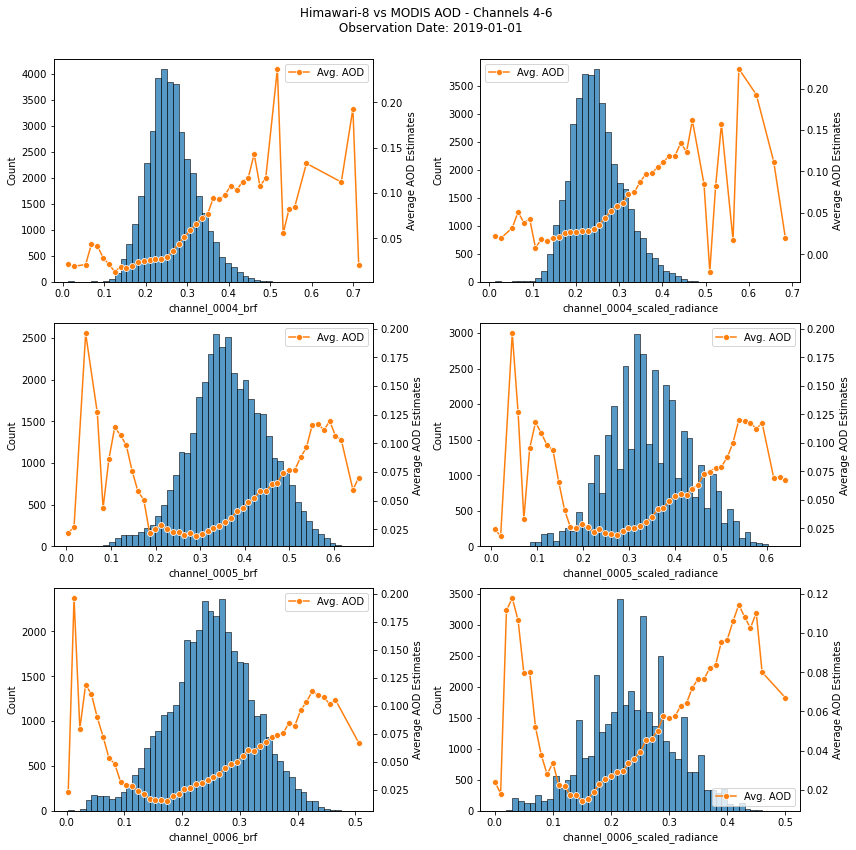

In [224]:
fig = plt.figure(figsize=(12,12))

for i, channel in enumerate(channel_list[6:12]):
    ax = plt.subplot(3, 2, i+1)
    
    bins = np.histogram_bin_edges(df_H8_MODIS[channel], bins=50)
    
    df = df_H8_MODIS.loc[:,[channel,'AOD_550_Dark_Target_Deep_Blue_Combined']]
    df['bin'] = df_H8_MODIS[channel].apply(lambda x: bins[bins <= x].max())
    df = df.groupby('bin').agg({"AOD_550_Dark_Target_Deep_Blue_Combined": np.mean})#, "channel_0001_brf": np.size})
    
    ax = sns.histplot(data=df_H8_MODIS, x=channel, bins=bins)
    ax2 = ax.twinx()
    sns.lineplot(x=df.index, y='AOD_550_Dark_Target_Deep_Blue_Combined', data=df, marker='o', color='tab:orange', ax=ax2)
    ax2.set_ylabel('Average AOD Estimates')
    ax2.legend(labels=['Avg. AOD'])
    
fig.suptitle(f'Himawari-8 vs MODIS AOD - Channels 4-6 \n Observation Date: {PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.92)
plt.savefig(f'../../sem1report_h8_aod_nir.png', facecolor='white', bbox_inches='tight')

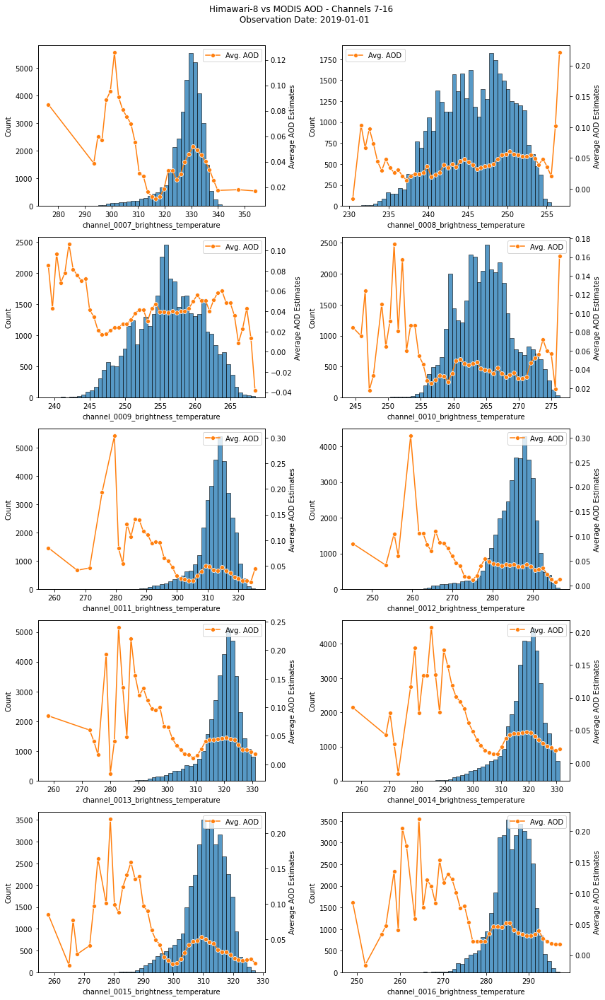

In [226]:
fig = plt.figure(figsize=(12,20))

for i, channel in enumerate(channel_list[12:]):
    ax = plt.subplot(5, 2, i+1)
    
    bins = np.histogram_bin_edges(df_H8_MODIS[channel], bins=50)
    
    df = df_H8_MODIS.loc[:,[channel,'AOD_550_Dark_Target_Deep_Blue_Combined']]
    df['bin'] = df_H8_MODIS[channel].apply(lambda x: bins[bins <= x].max())
    df = df.groupby('bin').agg({"AOD_550_Dark_Target_Deep_Blue_Combined": np.mean})#, "channel_0001_brf": np.size})
    
    ax = sns.histplot(data=df_H8_MODIS, x=channel, bins=bins)
    ax2 = ax.twinx()
    sns.lineplot(x=df.index, y='AOD_550_Dark_Target_Deep_Blue_Combined', data=df, marker='o', color='tab:orange', ax=ax2)
    ax2.set_ylabel('Average AOD Estimates')
    ax2.legend(labels=['Avg. AOD'])
    
fig.suptitle(f'Himawari-8 vs MODIS AOD - Channels 7-16 \n Observation Date: {PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.94)
plt.savefig(f'../../sem1report_h8_aod_ir.png', facecolor='white', bbox_inches='tight')